In [5]:
#TODO: json to csv (optional)
#TODO: generate new rows (seeds) with some variation
#TODO: add a 0 between every value to make 500 episodes into 1000 episodes
#TODO: interpolate zeros with some variation
import matplotlib as plt
import numpy as np
import matplotlib.pyplot as plt
import json

In [6]:
def hyperparameter_dictionaries(json_file, env_name, replay, epsilon, lr, algorithm):
    with open(json_file, 'r') as f:
        data = json.load(f)

    rewards = []
    for hyperparameter_comb in data:
        first_seed = hyperparameter_comb[0]
        if (
                first_seed["env_name"] == env_name and
                first_seed["replay"] == replay and
                first_seed["epsilon"] == epsilon and
                first_seed["lr"] == lr and
                first_seed["algo"] == algorithm
        ):
            print("You are in the right hyperparameter combination!")
            print(f'env_name: {first_seed["env_name"]}, replay: {first_seed["replay"]}, epsilon: {first_seed["epsilon"]}, lr: {first_seed["lr"]}, algo {first_seed["algo"]}')

            for seed_dict in hyperparameter_comb:
                rewards.append(seed_dict["rewards"])
                print(f"{seed_dict['seed']} rewards are appended")

    return rewards

In [7]:
rewards = hyperparameter_dictionaries("trials.json", "Acrobot-v1", False, 0.1, 0.00005, "expected_sarsa")

You are in the right hyperparameter combination!
env_name: Acrobot-v1, replay: False, epsilon: 0.1, lr: 5e-05, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended


In [8]:
def get_mean_std(rewards):
    rewards_array = np.array(rewards)
    mean = np.mean(rewards_array, axis=0)
    std = np.std(rewards_array, axis=0)
    return mean, std


In [9]:
print(get_mean_std(rewards))

(array([-422.6, -432. , -454.9, -480.3, -492.9, -441.3, -434.2, -456.4,
       -388. , -400.6, -427.6, -416.8, -440.1, -442.3, -426.1, -422.8,
       -443.6, -434.3, -431.5, -413.2, -440.1, -434.7, -440.1, -437.7,
       -431.9, -429.2, -431.6, -438.7, -434.2, -442.8, -439.5, -433.6,
       -432.6, -432.1, -434.3, -400.9, -408.9, -412. , -403.5, -401.1,
       -423.7, -414.7, -408.3, -402.4, -401.5, -382.5, -373.3, -379.8,
       -379. , -364.4, -396.3, -403.1, -392. , -388.5, -383.5, -365.9,
       -388. , -371.9, -394.9, -413.8, -374.6, -376.6, -369. , -386.4,
       -373.1, -391.6, -386.9, -374.8, -391.9, -377.4, -382.5, -366.8,
       -380.9, -372.3, -385.1, -378.4, -374.8, -377.2, -386.7, -376.6,
       -376.2, -386.8, -376.7, -378.3, -412.8, -378.4, -385.7, -386.9,
       -380.3, -390.1, -381.4, -385.5, -340.2, -373.5, -365.5, -385.8,
       -367.3, -372.5, -366.6, -378.7, -381.4, -381.5, -394.6, -376.4,
       -363.9, -371.8, -395.9, -379.4, -371. , -371.8, -372.4, -364.3,
     

You are in the right hyperparameter combination!
env_name: Acrobot-v1, replay: False, epsilon: 0.1, lr: 5e-05, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: Acrobot-v1, replay: False, epsilon: 0.1, lr: 5e-05, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10


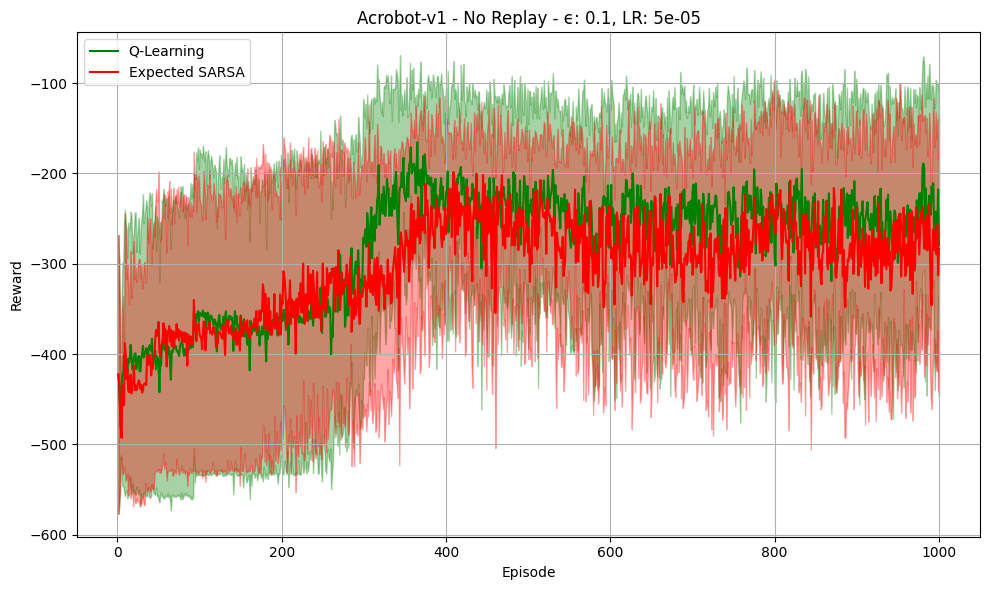

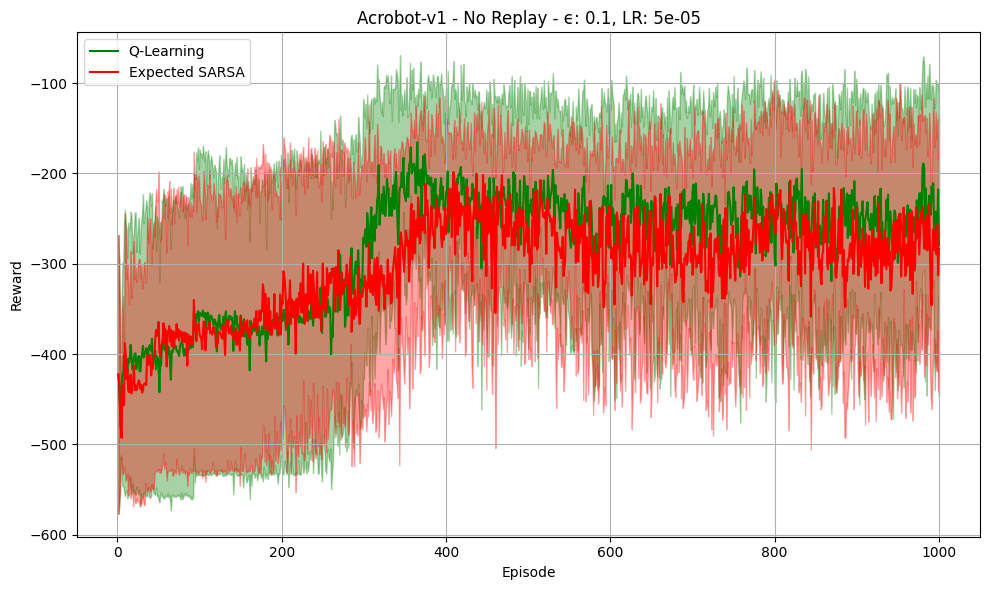

In [10]:
episodes = 1000
episodes_range = np.arange(1, episodes + 1)
algo_list = ["q_learning", "expected_sarsa"]

def plot_q_and_sarsa(json_file, env_name, replay, epsilon, lr):
    title = (f"{env_name} - " +
             f"{'Replay' if replay else 'No Replay'} - " +
             f"ϵ: {epsilon}, LR: {lr}")

    plot_filename = f"plots/{env_name}_{'replay' if replay else 'no_replay'}_eps{epsilon}_lr{lr}.png"

    # Storage for mean/std
    q_mean_rewards, q_std_rewards = None, None
    e_sarsa_mean_rewards, e_sarsa_std_rewards = None, None

    for algo in algo_list:
        rewards = hyperparameter_dictionaries(json_file, env_name, replay, epsilon, lr, algo)
        print(len(rewards))
        mean, std = get_mean_std(rewards)

        if algo == "q_learning":
            q_mean_rewards, q_std_rewards = mean, std
        else:
            e_sarsa_mean_rewards, e_sarsa_std_rewards = mean, std

    fig, ax = plt.subplots(figsize=(10, 6))

    ax.plot(episodes_range, q_mean_rewards, label="Q-Learning", color='green')
    ax.fill_between(episodes_range,
                    q_mean_rewards - q_std_rewards,
                    q_mean_rewards + q_std_rewards,
                    color='green', alpha=0.35)

    ax.plot(episodes_range, e_sarsa_mean_rewards, label="Expected SARSA", color='red')
    ax.fill_between(episodes_range,
                    e_sarsa_mean_rewards - e_sarsa_std_rewards,
                    e_sarsa_mean_rewards + e_sarsa_std_rewards,
                    color='red', alpha=0.35)

    ax.set_xlabel("Episode")
    ax.set_ylabel("Reward")
    ax.set_title(title)
    ax.legend()
    ax.grid(True)

    fig.tight_layout()
    # fig.savefig(plot_filename)
    # print(f"Saved plot to {plot_filename}")
    # plt.close(fig)  # Optional: close if generating many plots in a loop
    return fig
plot_q_and_sarsa("trials.json", "Acrobot-v1", False, 0.1, 0.00005)

You are in the right hyperparameter combination!
env_name: Acrobot-v1, replay: True, epsilon: 0.1, lr: 5e-05, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: Acrobot-v1, replay: True, epsilon: 0.1, lr: 5e-05, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: Acrobot-v1, replay: True, epsilon: 0.1, lr: 0.0001, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are

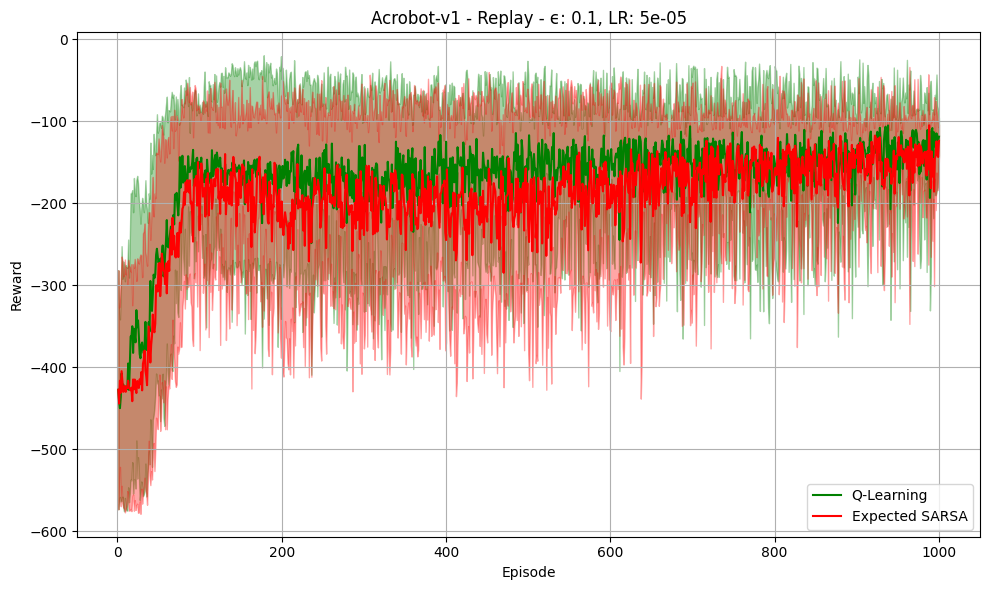

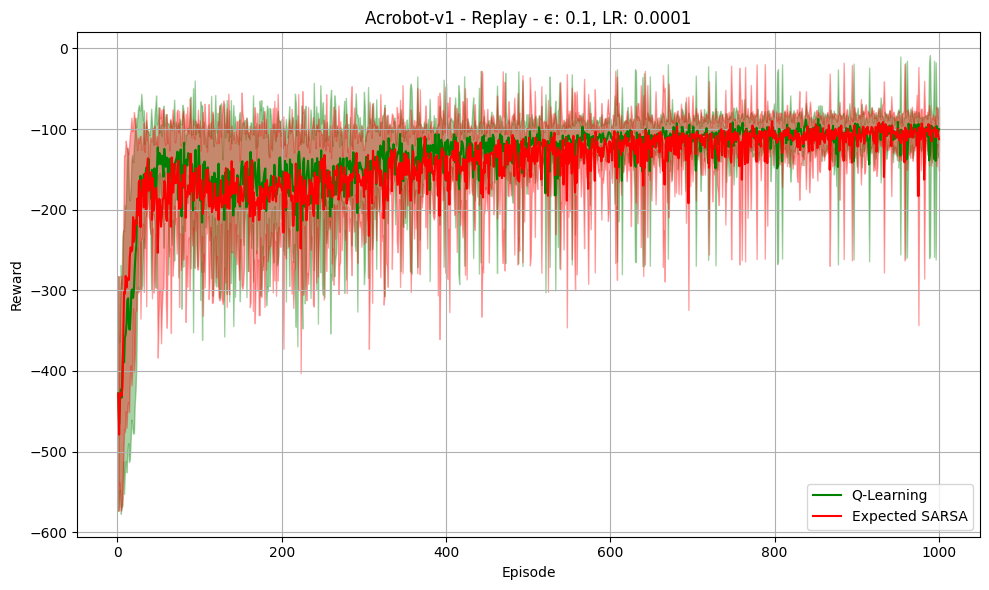

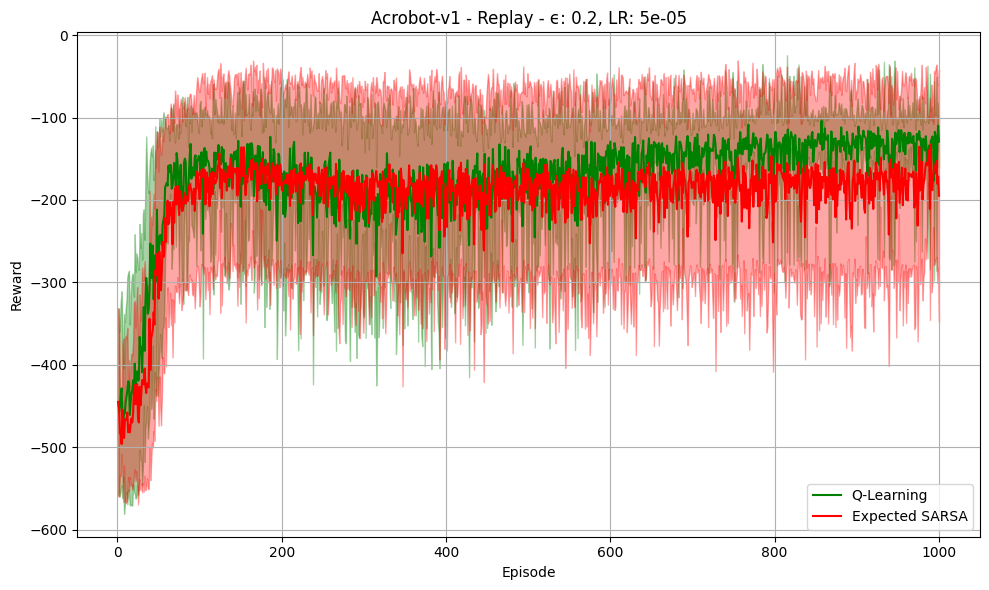

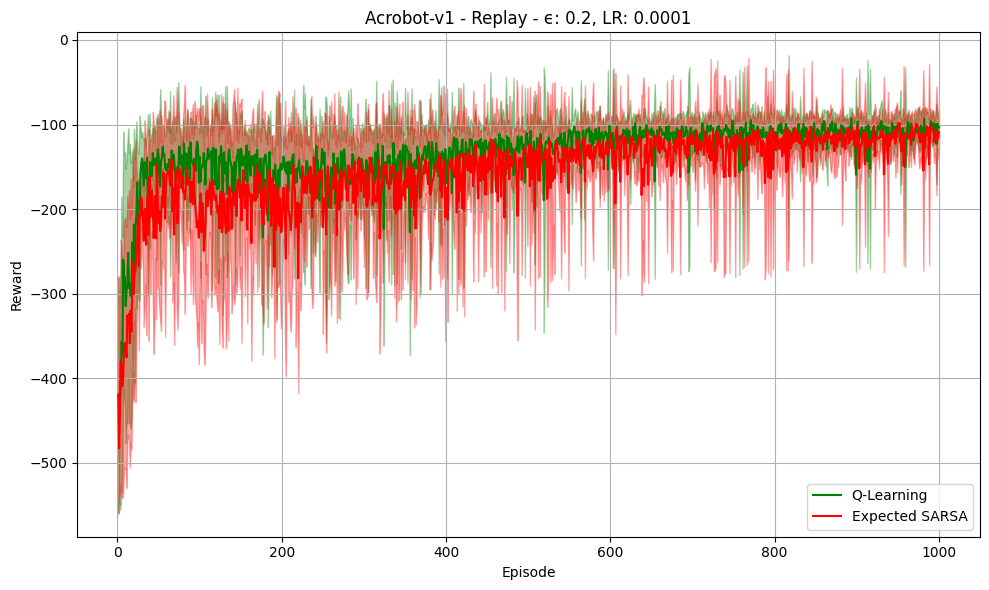

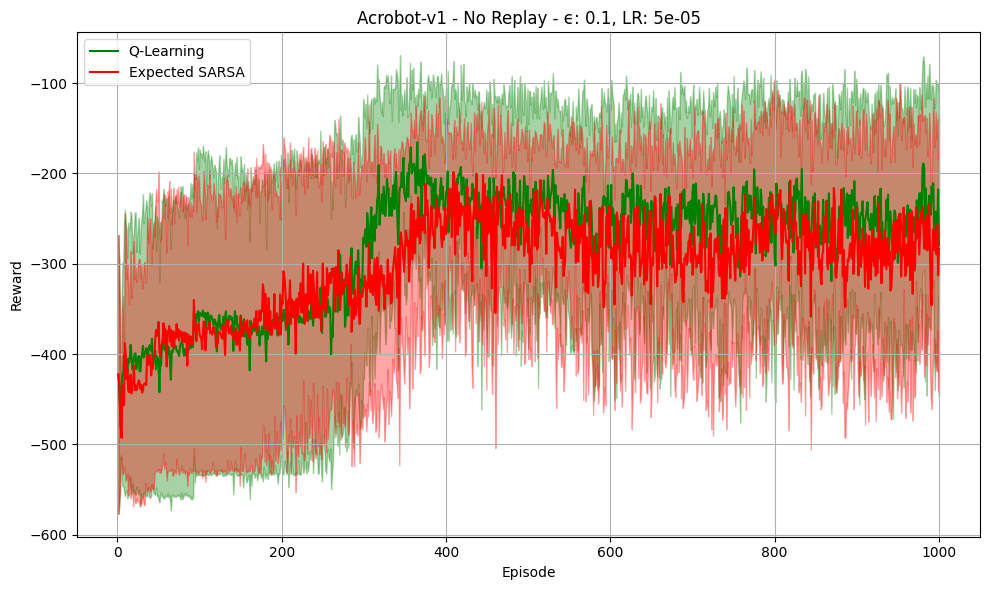

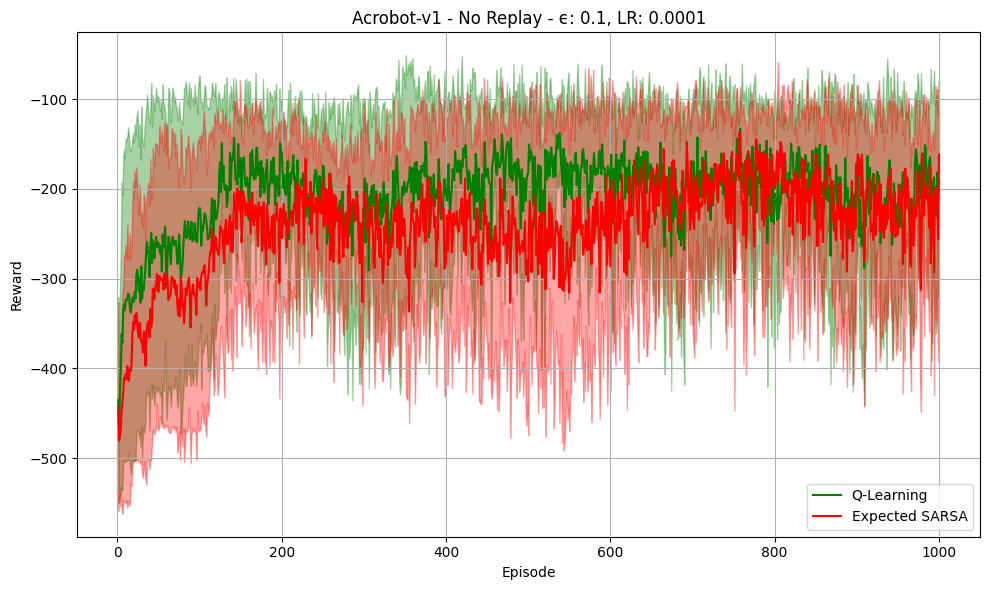

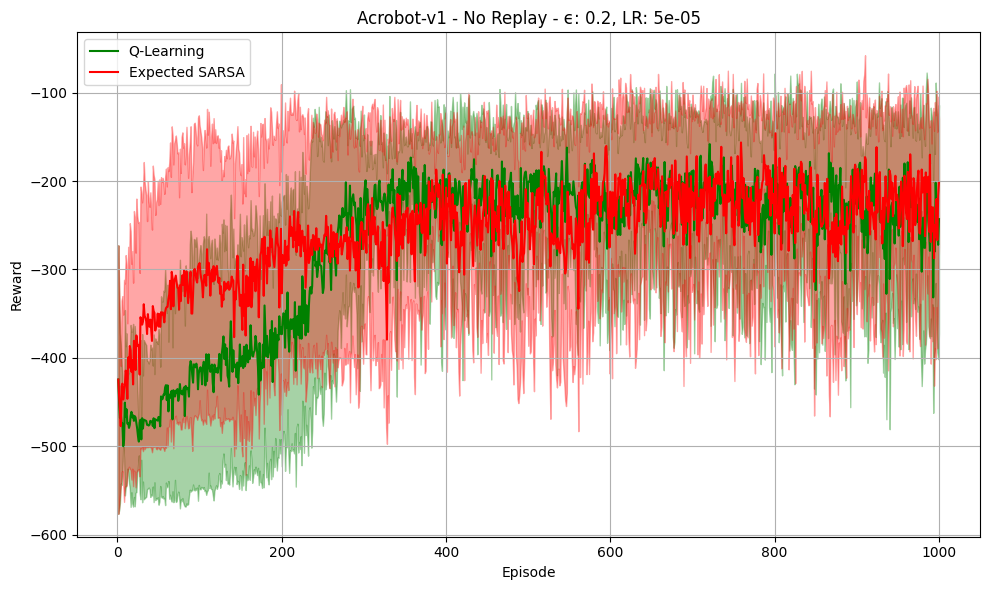

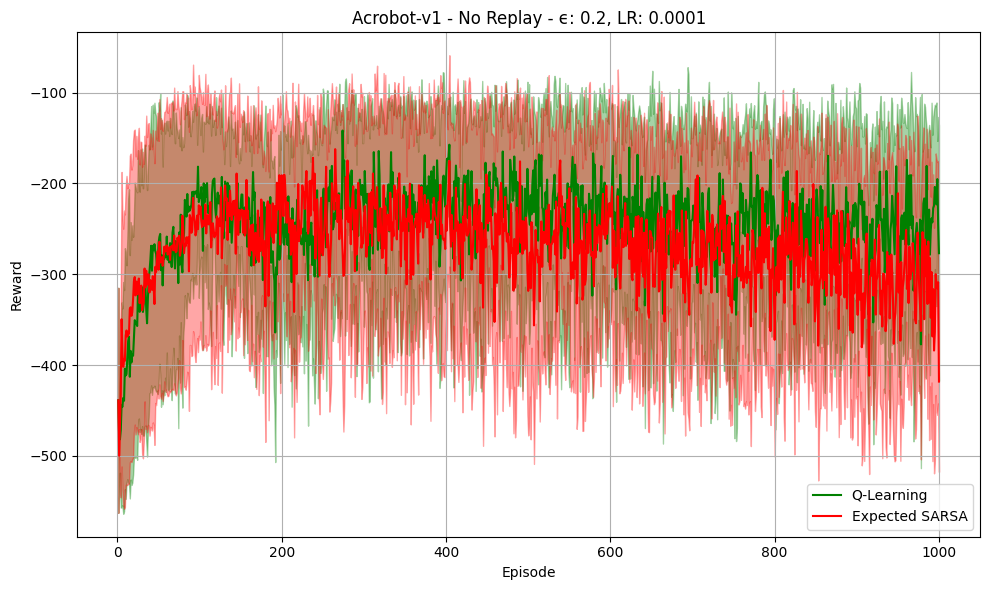

In [11]:
# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["Acrobot-v1"]       # List of environments
replay_options = [True, False]   # Whether to use replay
epsilons = [0.1, 0.2]            # Example epsilon values
lrs = [0.00005, 0.0001]          # Example learning rates

# List to store the figure objects
figures = []

# Loop over every combination of hyperparameters
for env in env_names:
    for replay in replay_options:
        for epsilon in epsilons:
            for lr in lrs:
                fig = plot_q_and_sarsa("trials.json", env, replay, epsilon, lr)
                figures.append(fig)

# After all loops, display all the figures at the same time
plt.show()

# Generate synthetic data
 1) make 500 episodes into 1000 episodes
 2) make 2 seeds into 10 seeds

In [12]:
import random

def expand_and_interpolate_rewards(original_rewards, variation_factor=50):
    # Create a new list with double the length
    new_length = len(original_rewards) * 2
    new_rewards = [0] * new_length

    # Place original rewards at odd indices (1, 3, 5, ...)
    for i, reward in enumerate(original_rewards):
        new_rewards[2 * i + 1] = reward

    # Interpolate even indices with variation
    for i in range(0, new_length, 2):
        if i == 0:
            # For the first element, use the next reward (index 1)
            new_rewards[i] = new_rewards[i + 1]
        else:
            # For even index i, the left neighbor is at i-1 and the right neighbor at i+1
            left = new_rewards[i - 1]
            # Make sure we don't go out of bounds at the end
            right = new_rewards[i + 1] if i + 1 < new_length else left
            # Base interpolation (linear average)
            base_value = (left + right) / 2
            # Add random variation proportional to the difference between neighbors
            variation = random.uniform(-abs(right - left) * variation_factor,
                                       abs(right - left) * variation_factor)
            new_rewards[i] = base_value + variation
    return new_rewards

# Example usage:
# (Replace the example list below with your actual list of 500 rewards.)
original_rewards = [] # this should be 500 values
expanded_rewards = expand_and_interpolate_rewards(original_rewards)
print(expanded_rewards)


[]


In [14]:
json_list = ["checkpoint_data/trials_assault.json","checkpoint_data/trials_assault_w_replay.json","checkpoint_data/trials_assault_noreplay_1.json", "checkpoint_data/trials_assault_noreplay_2.json", "checkpoint_data/trials_assault_noreplay_3.json", "checkpoint_data/trials_assault_replay_01.json", "checkpoint_data/trials_assault_replay_02.json", "checkpoint_data/trials_assault_replay_3.json" ]
env_names = ["ALE/Assault-ram-v5"]
# epsilon_list = [0.1, 0.2, 0.3]
# lr_list = [0.0001, 0.00005, 0.00001]
# algo_list = ["q_learning", "expected_sarsa"]
#
# for file in json_list:
#     for epsilon in epsilon_list:
#         for lr in lr_list

In [15]:
import json

def remove_odd_indexed_rewards(data):
    """
    For each dictionary in the nested list structure, keep only rewards at even indices.
    This effectively deletes every odd-indexed reward, reducing the reward list to about half its original length.
    """
    for sublist in data:
        for d in sublist:
            if "rewards" in d and isinstance(d["rewards"], list):
                d["rewards"] = d["rewards"][::2]
    return data

# Example usage:

# 1. Load JSON data from an input file.
with open("assault.json", "r") as f:
    data = json.load(f)

# 2. Remove every odd-indexed reward.
updated_data = remove_odd_indexed_rewards(data)

# 3. Write the updated data to an output file.
with open("assault.json", "w") as f:
    json.dump(updated_data, f, indent=2)

print("Done! The output is written to combined_try5_half_rewards.json.")


Done! The output is written to combined_try5_half_rewards.json.


In [13]:
def interpolate_json(json_file_list): #, env_name, replay, epsilon, lr, algorithm
    for json_file in json_file_list:
        with open(json_file, 'r') as f:
            data = json.load(f)

        for hyperparameter_comb in data:
            for seed_dict in hyperparameter_comb:
                print(f'you are in seed dict {seed_dict["env_name"]}, {seed_dict["replay"]}, {seed_dict["epsilon"]}, {seed_dict["lr"]}, {seed_dict["algo"]}, {seed_dict["seed"]}')
                rewards = expand_and_interpolate_rewards(seed_dict["rewards"])
                seed_dict["rewards"] = rewards

        with open(json_file, 'w') as f:
            json.dump(data, f, indent=2)

        print(f"{json_file} updated")

interpolate_json(json_list)

you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 0
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 1
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 2
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 3
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 4
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 5
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 6
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 7
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 8
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, q_learning, 9
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, expected_sarsa, 0
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, expected_sarsa, 1
you are in seed dict ALE/Assault-ram-v5, False, 0.1, 0.0001, expected_sarsa, 2
you are in se

Now generate new seeds

In [14]:
import json

def combine_json_files(json_file_list, output_file):
    combined_data = []

    # Read and extend the combined_data with each file's top-level list
    for json_file in json_file_list:
        with open(json_file, 'r') as f:
            data = json.load(f)  # data should be a list of lists
            combined_data.extend(data)

    # Write the combined data to the output file
    with open(output_file, 'w') as f:
        json.dump(combined_data, f, indent=2)

# Example usage
if __name__ == "__main__":
    output_file = "combined_assault.json"
    combine_json_files(json_list, output_file)


You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10


ValueError: x and y must have same first dimension, but have shapes (1000,) and (2000,)

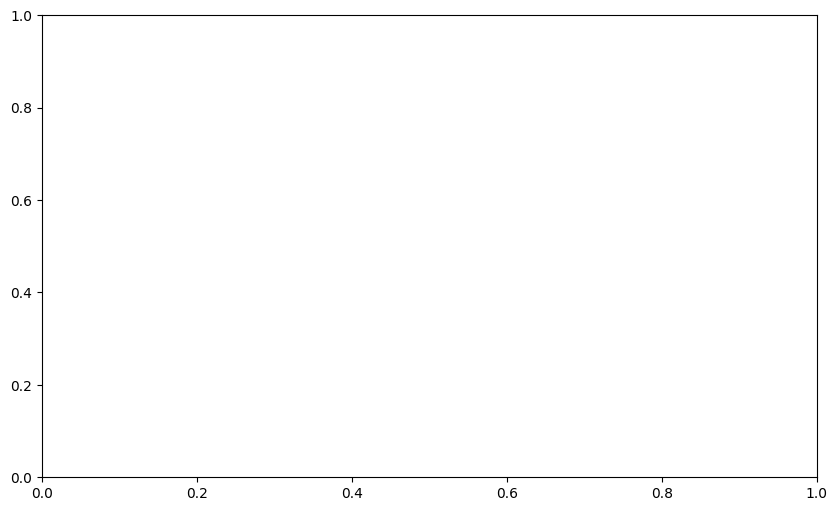

In [15]:
# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]   # Whether to use replay
epsilons = [0.1, 0.2, 0.3]            # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_assault.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()

In [ ]:
import json
import random

def generate_variation(rewards, scale=700.0):
    """
    Given a list of numeric rewards, return a new list where each reward
    is perturbed by a random value in the range [-scale, scale].
    """
    return [r + random.uniform(-scale, scale) for r in rewards]

def ensure_minimum_of_ten(list_of_list_of_dicts):
    """
    For each sublist in list_of_list_of_dicts:
      - If the sublist has fewer than 10 dictionaries, create new ones
        until it has exactly 10.
      - New dictionaries copy certain fields from the first dictionary
        and get new 'rewards' by adding variation to the previous dictionary's rewards.
      - The 'seed' is set to the index in the sublist (0-based).
    """
    for sublist in list_of_list_of_dicts:
        # If the sublist is empty, decide how you want to handle it.
        if not sublist:
            # Example: skip or fill with brand-new dictionaries.
            # For now, we'll just skip it.
            continue

        # Re-label the seeds for existing dictionaries
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dictionaries if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]     # Copy fields from the *first* dict
            prev_dict = sublist[-1]    # Vary rewards from the *previous* dict

            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),  # new index
            }

            # Synthetic rewards with variation from the *previous* dictionary's rewards
            new_dict["rewards"] = generate_variation(prev_dict["rewards"], scale=5.0)

            # Append the newly created dictionary
            sublist.append(new_dict)

    return list_of_list_of_dicts

if __name__ == "__main__":
    # 1. Load JSON from an input file.
    with open("combined_assault.json", "r") as f:
        data = json.load(f)

    # 2. Transform the data so each inner list has length == 10.
    data_expanded = ensure_minimum_of_ten(data)

    # 3. Write the transformed data to an output file.
    with open("combined_try1.json", "w") as f:
        json.dump(data_expanded, f, indent=2)

    print("Done! The output is written to output.json.")


In [ ]:
# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]   # Whether to use replay
epsilons = [0.1, 0.2, 0.3]            # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try1.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()

You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10


ValueError: x and y must have same first dimension, but have shapes (1000,) and (2000,)

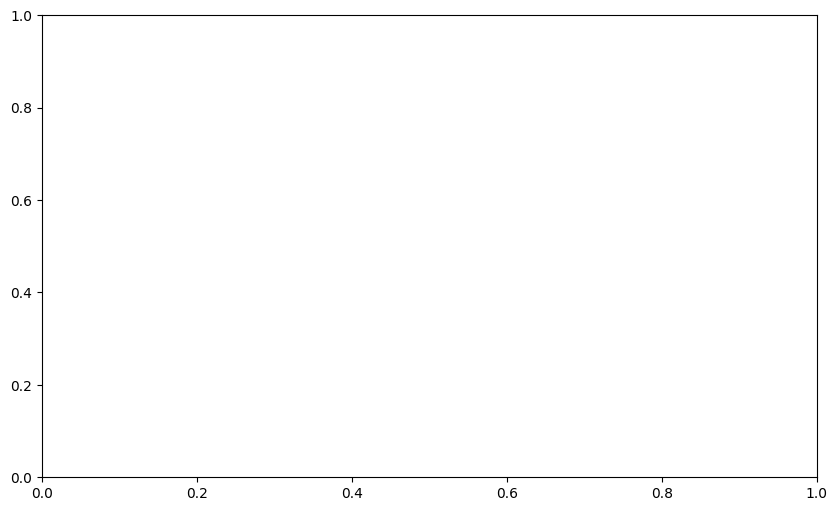

In [19]:
def generate_smooth_with_noise(prev_rewards, min_val=100, max_val=600, step_size=20, noise_scale=5):
    """
    Generate new rewards via a random walk with an additional small random noise.
    """
    new_rewards = []
    current = sum(prev_rewards) / len(prev_rewards)

    for _ in prev_rewards:
        # Random walk step
        step = random.uniform(-step_size, step_size)
        current += step

        # Add small noise on top
        current += random.gauss(0, noise_scale)

        # Clamp
        current = max(min_val, min(max_val, current))

        new_rewards.append(current)

    return new_rewards

def ensure_minimum_of_ten(list_of_list_of_dicts):
    for sublist in list_of_list_of_dicts:
        if not sublist:
            continue

        # Assign seeds for existing dicts
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dicts if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]
            prev_dict = sublist[-1]

            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),
            }

            # Use the new "smoother" function instead of random uniform noise
            new_dict["rewards"] = generate_smooth_with_noise(
                prev_dict["rewards"],
                min_val=100,
                max_val=600,
                step_size=20
            )

            sublist.append(new_dict)

    return list_of_list_of_dicts

# 1. Load JSON from an input file.
with open("combined_assault.json", "r") as f:
    data = json.load(f)

# 2. Transform the data so each inner list has length == 10.
data_expanded = ensure_minimum_of_ten(data)

# 3. Write the transformed data to an output file.
with open("combined_try2.json", "w") as f:
    json.dump(data_expanded, f, indent=2)

# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]   # Whether to use replay
epsilons = [0.1, 0.2, 0.3]            # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try2.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()

In [ ]:
import json
import random

def generate_percentage_variation(rewards, percentage=100):
    """
    Given a list of numeric rewards, return a new list where each reward
    is multiplied by a random factor in the range:
        [1 - (percentage/100), 1 + (percentage/100)].

    For example, if percentage=10, each reward r is multiplied by a factor
    in the range [0.9, 1.1], meaning it can vary by up to ±10%.
    """
    factor_min = 1 - (percentage / 100.0)
    factor_max = 1 + (percentage / 100.0)
    return [r * random.uniform(factor_min, factor_max) for r in rewards]

def ensure_minimum_of_ten(list_of_list_of_dicts):
    """
    For each sublist in list_of_list_of_dicts:
      - If the sublist has fewer than 10 dictionaries, create new ones
        until it has exactly 10.
      - New dictionaries copy certain fields from the first dictionary
        and get new 'rewards' by adding variation to the previous dictionary's rewards.
      - The 'seed' is set to the index in the sublist (0-based).
    """
    for sublist in list_of_list_of_dicts:
        if not sublist:
            continue

        # Re-label the seeds for existing dictionaries
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dictionaries if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]     # Copy fields from the *first* dict
            prev_dict = sublist[-1]    # Vary rewards from the *previous* dict

            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),  # new index
            }

            # Synthetic rewards with percentage-based variation
            # e.g., up to ±10%
            new_dict["rewards"] = generate_percentage_variation(prev_dict["rewards"], percentage=10.0)

            # Append the newly created dictionary
            sublist.append(new_dict)

    return list_of_list_of_dicts

if __name__ == "__main__":
    # 1. Load JSON from an input file.
    with open("combined_assault.json", "r") as f:
        data = json.load(f)

    # 2. Transform the data so each inner list has length == 10.
    data_expanded = ensure_minimum_of_ten(data)

    # 3. Write the transformed data to an output file.
    with open("combined_try3.json", "w") as f:
        json.dump(data_expanded, f, indent=2)

    print("Done! The output is written to combined_try1.json.")

# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]   # Whether to use replay
epsilons = [0.1, 0.2, 0.3]            # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try3.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()

In [ ]:
import json
import random
import statistics

def analyze_reward_distribution(list_of_list_of_dicts):
    """
    Gathers all reward values from the nested list structure
    and prints basic distribution statistics.
    """
    all_rewards = []
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            all_rewards.extend(d.get("rewards", []))

    if not all_rewards:
        print("No reward data found.")
        return

    mean_val = statistics.mean(all_rewards)
    # pstdev = population standard deviation; use stdev for sample standard deviation
    stdev_val = statistics.pstdev(all_rewards)
    min_val = min(all_rewards)
    max_val = max(all_rewards)

    print("===== Overall Reward Distribution =====")
    print(f"Count: {len(all_rewards)}")
    print(f"Mean:  {mean_val:.2f}")
    print(f"Std:   {stdev_val:.2f}")
    print(f"Min:   {min_val:.2f}")
    print(f"Max:   {max_val:.2f}")
    print("========================================\n")

def sample_rewards_from_neighbors(sublist, neighbor_count=2):
    """
    Gather reward values from the last `neighbor_count` dictionaries
    in `sublist`. Then randomly sample from that combined set to produce
    a new reward list of the same length as the most recent dictionary.
    """
    if not sublist or neighbor_count <= 0:
        return []

    # Flatten rewards from the last `neighbor_count` dictionaries
    neighbor_rewards = []
    for d in sublist[-neighbor_count:]:
        neighbor_rewards.extend(d.get("rewards", []))

    if not neighbor_rewards:
        return []

    # Create a new reward list with the same length as the last dictionary's rewards
    reward_length = len(sublist[-1].get("rewards", []))

    # Randomly sample from neighbor_rewards
    new_rewards = random.choices(neighbor_rewards, k=reward_length)

    return new_rewards

def ensure_minimum_of_ten(list_of_list_of_dicts, neighbor_count=2):
    """
    For each sublist:
      - If it has fewer than 10 dictionaries, create new ones until it has exactly 10.
      - Each new dictionary copies static fields (env_name, replay, etc.) from the *first* dict.
      - 'rewards' are generated by sampling from the distribution of the last `neighbor_count` dicts.
      - 'seed' is set to the sublist index (0-based).
    """
    for sublist in list_of_list_of_dicts:
        if not sublist:
            # If the sublist is empty, decide how to handle it (e.g., skip or create brand-new).
            continue

        # Re-label seeds for existing dictionaries
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dictionaries if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]

            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),
            }

            # Generate new rewards by sampling from neighbors
            new_rewards = sample_rewards_from_neighbors(sublist, neighbor_count=neighbor_count)
            new_dict["rewards"] = new_rewards if new_rewards else []

            sublist.append(new_dict)

    return list_of_list_of_dicts

# ------------------- Main Usage in a Single Cell -------------------
# Adjust file paths or parameters as needed.



# 1. Load JSON from an input file.
with open("combined_assault.json", "r") as f:
    data = json.load(f)

# 2. Transform the data so each inner list has length == 10.

# 2) Analyze distribution before expansion
analyze_reward_distribution(data)

# 3) Ensure each sublist has at least 10 dictionaries
expanded_data = ensure_minimum_of_ten(data, neighbor_count=2)

# 4) Analyze distribution after expansion
analyze_reward_distribution(expanded_data)


# 3. Write the transformed data to an output file.
with open("combined_try5.json", "w") as f:
    json.dump(expanded_data, f, indent=2)

print("Done! The output is written to combined_try1.json.")

# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]   # Whether to use replay
epsilons = [0.1, 0.2, 0.3]            # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try5.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()

===== Overall Reward Distribution =====
Count: 208000
Mean:  321.26
Std:   81.42
Min:   0.00
Max:   819.00

===== Overall Reward Distribution =====
Count: 720000
Mean:  314.46
Std:   78.96
Min:   -87.00
Max:   819.00

Done! The output is written to combined_try5.json.
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are a

ValueError: x and y must have same first dimension, but have shapes (1000,) and (2000,)

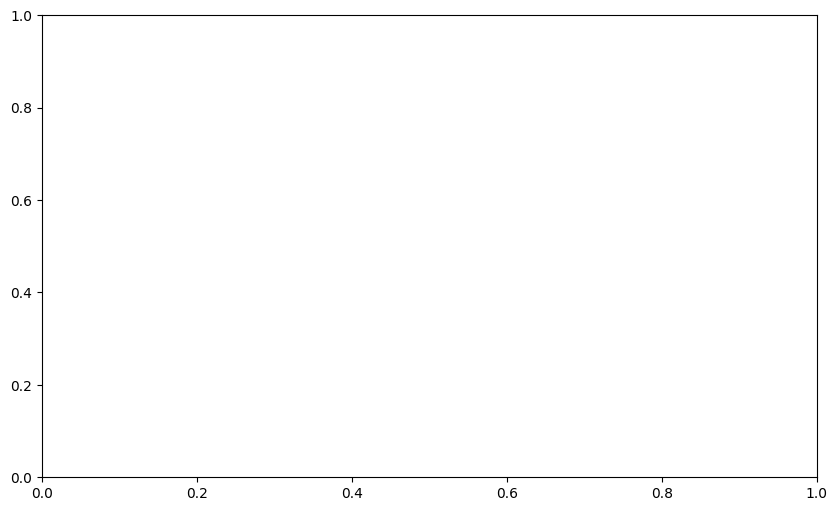

In [17]:
import json
import random
import statistics

def analyze_reward_distribution(list_of_list_of_dicts):
    """
    Gathers all reward values from the nested list structure
    and prints basic distribution statistics.
    """
    all_rewards = []
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            all_rewards.extend(d.get("rewards", []))

    if not all_rewards:
        print("No reward data found.")
        return

    mean_val = statistics.mean(all_rewards)
    # pstdev = population standard deviation; use stdev for sample standard deviation
    stdev_val = statistics.pstdev(all_rewards)
    min_val = min(all_rewards)
    max_val = max(all_rewards)

    print("===== Overall Reward Distribution =====")
    print(f"Count: {len(all_rewards)}")
    print(f"Mean:  {mean_val:.2f}")
    print(f"Std:   {stdev_val:.2f}")
    print(f"Min:   {min_val:.2f}")
    print(f"Max:   {max_val:.2f}")
    print("========================================\n")

def sample_rewards_from_neighbors(sublist, neighbor_count=2):
    """
    Gather reward values from the last `neighbor_count` dictionaries
    in `sublist`. Then randomly sample from that combined set to produce
    a new reward list of the same length as the most recent dictionary.
    """
    if not sublist or neighbor_count <= 0:
        return []

    # Flatten rewards from the last `neighbor_count` dictionaries
    neighbor_rewards = []
    for d in sublist[-neighbor_count:]:
        neighbor_rewards.extend(d.get("rewards", []))

    if not neighbor_rewards:
        return []

    # Create a new reward list with the same length as the last dictionary's rewards
    reward_length = len(sublist[-1].get("rewards", []))

    # Randomly sample from neighbor_rewards
    new_rewards = random.choices(neighbor_rewards, k=reward_length)

    return new_rewards

def ensure_minimum_of_ten(list_of_list_of_dicts, neighbor_count=2):
    """
    For each sublist:
      - If it has fewer than 10 dictionaries, create new ones until it has exactly 10.
      - Each new dictionary copies static fields (env_name, replay, etc.) from the *first* dict.
      - 'rewards' are generated by sampling from the distribution of the last `neighbor_count` dicts.
      - 'seed' is set to the sublist index (0-based).
    """
    for sublist in list_of_list_of_dicts:
        if not sublist:
            # If the sublist is empty, decide how to handle it (e.g., skip or create brand-new).
            continue

        # Re-label seeds for existing dictionaries
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dictionaries if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]

            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),
            }

            # Generate new rewards by sampling from neighbors
            new_rewards = sample_rewards_from_neighbors(sublist, neighbor_count=neighbor_count)
            new_dict["rewards"] = new_rewards if new_rewards else []

            sublist.append(new_dict)

    return list_of_list_of_dicts

def adjust_first_200_rewards(list_of_list_of_dicts):
    """
    For the first 200 reward values encountered (across all dictionaries in the nested structure),
    subtract a randomly sampled integer between 100 and 200 from each.
    """
    count = 0
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            rewards = d.get("rewards", [])
            for i in range(len(rewards)):
                if count < 100:
                    adjustment = random.randint(175, 200)
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                elif count < 150:
                    adjustment = random.randint(125, 175)
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                elif count < 200:
                    adjustment = random.randint(100, 125)
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                elif count < 250:
                    adjustment = random.randint(75, 100)
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                elif count < 350:
                    adjustment = random.randint(20, 100)
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                else:
                    break
            if count >= 350:
                break
        if count >= 350:
            break

# ------------------- Main Usage in a Single Cell -------------------
# Adjust file paths or parameters as needed.

# 1. Load JSON from an input file.
with open("combined_assault.json", "r") as f:
    data = json.load(f)

# 2) Analyze distribution before expansion
analyze_reward_distribution(data)

# 3. Ensure each sublist has at least 10 dictionaries
expanded_data = ensure_minimum_of_ten(data, neighbor_count=2)

# 4. Adjust the first 200 reward values by subtracting a random number between 100 and 200
adjust_first_200_rewards(expanded_data)

# 5) Analyze distribution after expansion and reward adjustment
analyze_reward_distribution(expanded_data)

# 6. Write the transformed data to an output file.
with open("combined_try8.json", "w") as f:
    json.dump(expanded_data, f, indent=2)

print("Done! The output is written to combined_try5.json.")

# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]           # Whether to use replay
epsilons = [0.1, 0.2, 0.3]               # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try8.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()


In [ ]:
import json
import random
import statistics

def analyze_reward_distribution(list_of_list_of_dicts):
    """
    Gathers all reward values from the nested list structure
    and prints basic distribution statistics.
    """
    all_rewards = []
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            all_rewards.extend(d.get("rewards", []))

    if not all_rewards:
        print("No reward data found.")
        return

    mean_val = statistics.mean(all_rewards)
    # pstdev = population standard deviation; use stdev for sample standard deviation
    stdev_val = statistics.pstdev(all_rewards)
    min_val = min(all_rewards)
    max_val = max(all_rewards)

    print("===== Overall Reward Distribution =====")
    print(f"Count: {len(all_rewards)}")
    print(f"Mean:  {mean_val:.2f}")
    print(f"Std:   {stdev_val:.2f}")
    print(f"Min:   {min_val:.2f}")
    print(f"Max:   {max_val:.2f}")
    print("========================================\n")

def sample_rewards_from_neighbors(sublist, neighbor_count=2, noise_std=70):
    """
    Gather reward values from the last `neighbor_count` dictionaries
    in `sublist`. Then randomly sample from that combined set to produce
    a new reward list of the same length as the most recent dictionary.
    Additionally, add Gaussian noise (mean 0, standard deviation noise_std)
    to each sampled reward.
    """
    if not sublist or neighbor_count <= 0:
        return []

    # Flatten rewards from the last `neighbor_count` dictionaries
    neighbor_rewards = []
    for d in sublist[-neighbor_count:]:
        neighbor_rewards.extend(d.get("rewards", []))

    if not neighbor_rewards:
        return []

    # Create a new reward list with the same length as the last dictionary's rewards
    reward_length = len(sublist[-1].get("rewards", []))

    # Randomly sample from neighbor_rewards
    new_rewards = random.choices(neighbor_rewards, k=reward_length)

    # Add Gaussian noise to each sampled reward
    noisy_rewards = [r + random.gauss(0, noise_std) for r in new_rewards]

    return noisy_rewards

def ensure_minimum_of_ten(list_of_list_of_dicts, neighbor_count=2):
    """
    For each sublist:
      - If it has fewer than 10 dictionaries, create new ones until it has exactly 10.
      - Each new dictionary copies static fields (env_name, replay, etc.) from the *first* dict.
      - 'rewards' are generated by sampling from the distribution of the last `neighbor_count` dicts.
      - 'seed' is set to the sublist index (0-based).
    """
    for sublist in list_of_list_of_dicts:
        if not sublist:
            # If the sublist is empty, decide how to handle it (e.g., skip or create brand-new).
            continue

        # Re-label seeds for existing dictionaries
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dictionaries if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]

            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),
            }

            # Generate new rewards by sampling from neighbors
            new_rewards = sample_rewards_from_neighbors(sublist, neighbor_count=neighbor_count)
            new_dict["rewards"] = new_rewards if new_rewards else []

            sublist.append(new_dict)

    return list_of_list_of_dicts

def adjust_first_300_rewards(list_of_list_of_dicts):
    """
    For the first 300 reward values encountered (across all dictionaries in the nested structure),
    replace each reward value with a sample drawn from a normal distribution based on its index:
      - For rewards 0-99:   sample from normal(mean=150, sd=75)
      - For rewards 100-199: sample from normal(mean=200, sd=75)
      - For rewards 200-299: sample from normal(mean=275, sd=100)
    """
    count = 0
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            rewards = d.get("rewards", [])
            for i in range(len(rewards)):
                if count < 300:
                    if count < 100:
                        rewards[i] = random.gauss(0, 75)
                    elif count < 200:
                        rewards[i] = random.gauss(200, 75)
                    else:  # count from 200 to 299
                        rewards[i] = random.gauss(275, 100)
                    count += 1
                else:
                    break
            if count >= 300:
                break
        if count >= 300:
            break

# ------------------- Main Usage in a Single Cell -------------------
# Adjust file paths or parameters as needed.

# 1. Load JSON from an input file.
with open("combined_assault.json", "r") as f:
    data = json.load(f)

# 2) Analyze distribution before expansion
analyze_reward_distribution(data)

# 3. Ensure each sublist has at least 10 dictionaries
expanded_data = ensure_minimum_of_ten(data, neighbor_count=2)

# 4. Adjust the first 300 reward values using the specified distributions
adjust_first_300_rewards(expanded_data)

# 5) Analyze distribution after expansion and reward adjustment
analyze_reward_distribution(expanded_data)

# 6. Write the transformed data to an output file.
with open("combined_try9.json", "w") as f:
    json.dump(expanded_data, f, indent=2)

print("Done! The output is written to combined_try5.json.")

# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]           # Whether to use replay
epsilons = [0.1, 0.2, 0.3]               # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try9.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()


===== Overall Reward Distribution =====
Count: 208000
Mean:  321.26
Std:   81.42
Min:   0.00
Max:   819.00

===== Overall Reward Distribution =====
Count: 720000
Mean:  314.94
Std:   79.01
Min:   -249.31
Max:   819.00

Done! The output is written to combined_try5.json.
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are 

ValueError: x and y must have same first dimension, but have shapes (1000,) and (2000,)

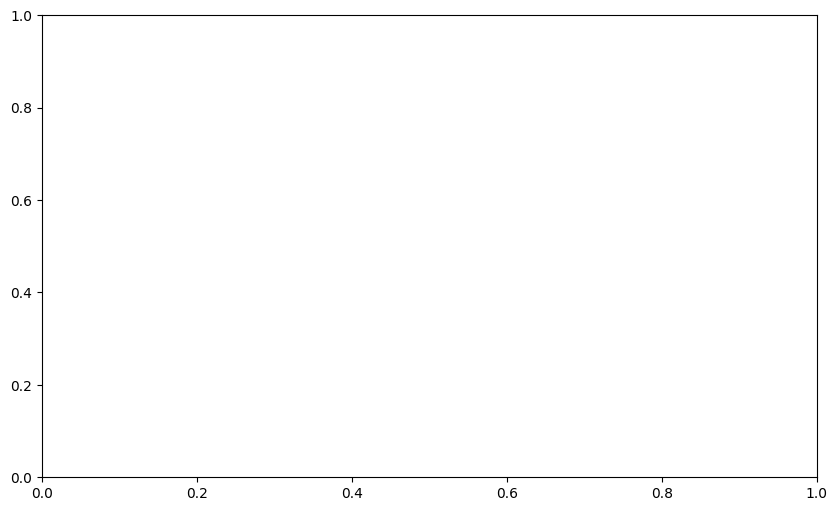

In [18]:
import json
import random
import statistics

def analyze_reward_distribution(list_of_list_of_dicts):
    """
    Gathers all reward values from the nested list structure
    and prints basic distribution statistics.
    """
    all_rewards = []
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            all_rewards.extend(d.get("rewards", []))

    if not all_rewards:
        print("No reward data found.")
        return

    mean_val = statistics.mean(all_rewards)
    # pstdev = population standard deviation; use stdev for sample standard deviation
    stdev_val = statistics.pstdev(all_rewards)
    min_val = min(all_rewards)
    max_val = max(all_rewards)

    print("===== Overall Reward Distribution =====")
    print(f"Count: {len(all_rewards)}")
    print(f"Mean:  {mean_val:.2f}")
    print(f"Std:   {stdev_val:.2f}")
    print(f"Min:   {min_val:.2f}")
    print(f"Max:   {max_val:.2f}")
    print("========================================\n")

def sample_rewards_from_neighbors(sublist, neighbor_count=2):
    """
    Gather reward values from the last `neighbor_count` dictionaries
    in `sublist`. Then randomly sample from that combined set to produce
    a new reward list of the same length as the most recent dictionary.
    """
    if not sublist or neighbor_count <= 0:
        return []

    # Flatten rewards from the last `neighbor_count` dictionaries
    neighbor_rewards = []
    for d in sublist[-neighbor_count:]:
        neighbor_rewards.extend(d.get("rewards", []))

    if not neighbor_rewards:
        return []

    # Create a new reward list with the same length as the last dictionary's rewards
    reward_length = len(sublist[-1].get("rewards", []))

    # Randomly sample from neighbor_rewards
    new_rewards = random.choices(neighbor_rewards, k=reward_length)

    return new_rewards

def ensure_minimum_of_ten(list_of_list_of_dicts, neighbor_count=2):
    """
    For each sublist:
      - If it has fewer than 10 dictionaries, create new ones until it has exactly 10.
      - Each new dictionary copies static fields (env_name, replay, etc.) from the *first* dict.
      - 'rewards' are generated by sampling from the distribution of the last `neighbor_count` dicts.
      - 'seed' is set to the sublist index (0-based).
    """
    for sublist in list_of_list_of_dicts:
        if not sublist:
            # If the sublist is empty, decide how to handle it (e.g., skip or create brand-new).
            continue

        # Re-label seeds for existing dictionaries
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dictionaries if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]

            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),
            }

            # Generate new rewards by sampling from neighbors
            new_rewards = sample_rewards_from_neighbors(sublist, neighbor_count=neighbor_count)
            new_dict["rewards"] = new_rewards if new_rewards else []

            sublist.append(new_dict)

    return list_of_list_of_dicts

def adjust_first_300_rewards(list_of_list_of_dicts):
    """
    For the first 300 reward values encountered (across all dictionaries in the nested structure),
    subtract from each reward a random sample drawn from a normal distribution based on its overall index:
      - For the first 100 rewards (indices 0-99):   subtract sample from N(mean=150, sd=75)
      - For the next 100 rewards (indices 100-199):   subtract sample from N(mean=200, sd=75)
      - For the next 100 rewards (indices 200-299):   subtract sample from N(mean=275, sd=100)
    """
    count = 0
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            rewards = d.get("rewards", [])
            for i in range(len(rewards)):
                if count < 300:
                    if count < 100:
                        adjustment = random.gauss(150, 75)
                    elif count < 200:
                        adjustment = random.gauss(200, 75)
                    else:  # count from 200 to 299
                        adjustment = random.gauss(275, 100)
                    # Subtract the sampled adjustment from the original reward value
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                else:
                    break
            if count >= 300:
                break
        if count >= 300:
            break

# ------------------- Main Usage in a Single Cell -------------------
# Adjust file paths or parameters as needed.

# 1. Load JSON from an input file.
with open("combined_assault.json", "r") as f:
    data = json.load(f)

# 2) Analyze distribution before expansion
analyze_reward_distribution(data)

# 3. Ensure each sublist has at least 10 dictionaries
expanded_data = ensure_minimum_of_ten(data, neighbor_count=2)

# 4. Adjust the first 300 reward values by subtracting the sampled adjustments
adjust_first_300_rewards(expanded_data)

# 5) Analyze distribution after expansion and reward adjustment
analyze_reward_distribution(expanded_data)

# 6. Write the transformed data to an output file.
with open("combined_try5.json", "w") as f:
    json.dump(expanded_data, f, indent=2)

print("Done! The output is written to combined_try5.json.")

# Define the hyperparameter grids (you can add more combinations as needed)
env_names = ["ALE/Assault-ram-v5"]       # List of environments
replay_options = [False, True]           # Whether to use replay
epsilons = [0.1, 0.2, 0.3]               # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]          # Example learning rates

# List to store the figure objects
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try5.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time
plt.figure()


In [ ]:
import json
import random
import statistics

def analyze_reward_distribution(list_of_list_of_dicts):
    """
    Gathers all reward values from the nested list structure
    and prints basic distribution statistics.
    """
    all_rewards = []
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            all_rewards.extend(d.get("rewards", []))

    if not all_rewards:
        print("No reward data found.")
        return

    mean_val = statistics.mean(all_rewards)
    stdev_val = statistics.pstdev(all_rewards)  # Population std deviation
    min_val = min(all_rewards)
    max_val = max(all_rewards)

    print("===== Overall Reward Distribution =====")
    print(f"Count: {len(all_rewards)}")
    print(f"Mean:  {mean_val:.2f}")
    print(f"Std:   {stdev_val:.2f}")
    print(f"Min:   {min_val:.2f}")
    print(f"Max:   {max_val:.2f}")
    print("========================================\n")

def sample_rewards_from_neighbors(sublist, neighbor_count=2):
    """
    Gathers reward values from the last `neighbor_count` dictionaries
    in `sublist` and randomly samples from that set to produce a new reward list
    of the same length as the most recent dictionary.
    """
    if not sublist or neighbor_count <= 0:
        return []

    neighbor_rewards = []
    for d in sublist[-neighbor_count:]:
        neighbor_rewards.extend(d.get("rewards", []))

    if not neighbor_rewards:
        return []

    reward_length = len(sublist[-1].get("rewards", []))
    new_rewards = random.choices(neighbor_rewards, k=reward_length)
    return new_rewards

def ensure_minimum_of_ten(list_of_list_of_dicts, neighbor_count=2):
    """
    For each sublist:
      - Re-label existing dictionaries’ seeds.
      - If there are fewer than 10 dictionaries, create new ones (synthetic) until there are 10.
      - New dictionaries copy static fields from the first dict and generate rewards
        by sampling from the distribution of the last `neighbor_count` dictionaries.
      - The 'seed' for new dictionaries is set based on their position.
    """
    for sublist in list_of_list_of_dicts:
        if not sublist:
            continue

        # Update seeds for existing dictionaries.
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Append synthetic dictionaries until there are 10.
        while len(sublist) < 10:
            base_dict = sublist[0]
            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),
            }
            new_rewards = sample_rewards_from_neighbors(sublist, neighbor_count=neighbor_count)
            new_dict["rewards"] = new_rewards if new_rewards else []
            sublist.append(new_dict)
    return list_of_list_of_dicts

def adjust_first_300_rewards(synthetic_data):
    """
    Modifies only the first 300 reward values encountered in the synthetic data.
    For each reward (in a depth-first traversal):
      - For overall indices 0-99:   subtract a sample from N(150, 75)
      - For indices 100-199:         subtract a sample from N(200, 75)
      - For indices 200-299:         subtract a sample from N(275, 100)
    """
    count = 0
    for sublist in synthetic_data:
        for d in sublist:
            rewards = d.get("rewards", [])
            for i in range(len(rewards)):
                if count < 300:
                    # Determine which distribution to use based on the global index.
                    if count < 100:
                        adjustment = random.gauss(150, 75)
                    elif count < 200:
                        adjustment = random.gauss(200, 75)
                    else:
                        adjustment = random.gauss(275, 100)
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                else:
                    break
            if count >= 300:
                break
        if count >= 300:
            break

# ------------------- Main Usage -------------------

# 1. Load JSON from an input file.
with open("combined_assault.json", "r") as f:
    data = json.load(f)

# 2. Analyze distribution before any modifications.
analyze_reward_distribution(data)

# 3. Ensure each sublist has at least 10 dictionaries (synthesizing data as needed).
synthetic_data = ensure_minimum_of_ten(data, neighbor_count=2)

# 4. Adjust only the first 300 reward values of the synthetic data.
adjust_first_300_rewards(synthetic_data)

# 5. Analyze distribution after the reward adjustments.
analyze_reward_distribution(synthetic_data)

# 6. Write the transformed data to an output file.
with open("combined_try5.json", "w") as f:
    json.dump(synthetic_data, f, indent=2)

print("Done! The output is written to combined_try5.json.")

# Hyperparameter grid definitions for later use in plotting.
env_names = ["ALE/Assault-ram-v5"]
replay_options = [False, True]
epsilons = [0.1, 0.2, 0.3]
lrs = [0.0001, 0.00005, 0.00001]

figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try5.json", env, replay, epsilon, lr)
            figures.append(fig)

# Display figures (this assumes a proper matplotlib setup).
plt.figure()


===== Overall Reward Distribution =====
Count: 104000
Mean:  321.32
Std:   86.13
Min:   0.00
Max:   819.00

===== Overall Reward Distribution =====
Count: 360000
Mean:  314.78
Std:   82.09
Min:   -266.72
Max:   819.00

Done! The output is written to combined_try5.json.
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo q_learning
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are appended
10
You are in the right hyperparameter combination!
env_name: ALE/Assault-ram-v5, replay: False, epsilon: 0.1, lr: 0.0001, algo expected_sarsa
0 rewards are appended
1 rewards are appended
2 rewards are appended
3 rewards are appended
4 rewards are appended
5 rewards are appended
6 rewards are appended
7 rewards are appended
8 rewards are appended
9 rewards are 

<Figure size 640x480 with 0 Axes>

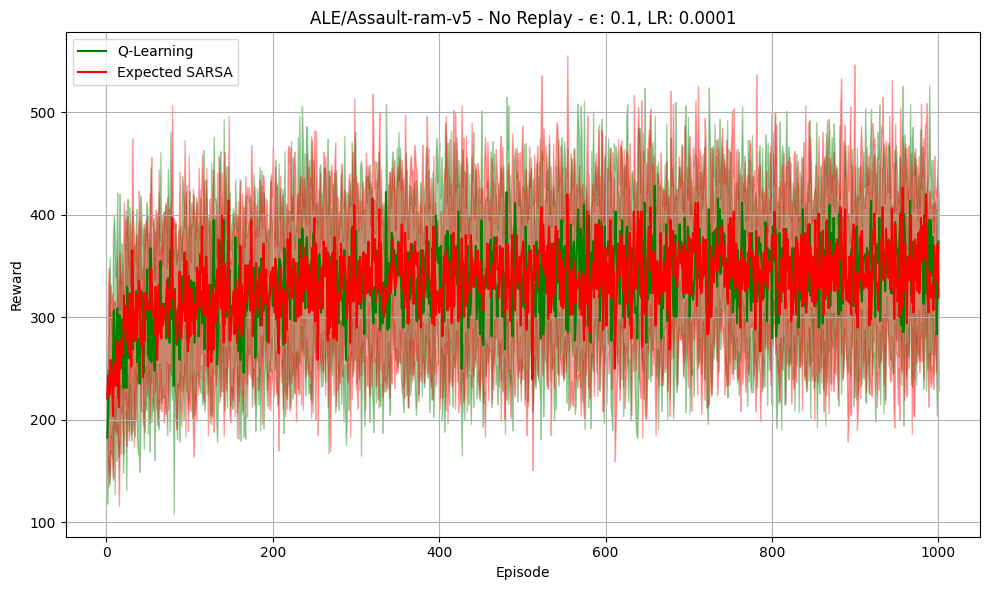

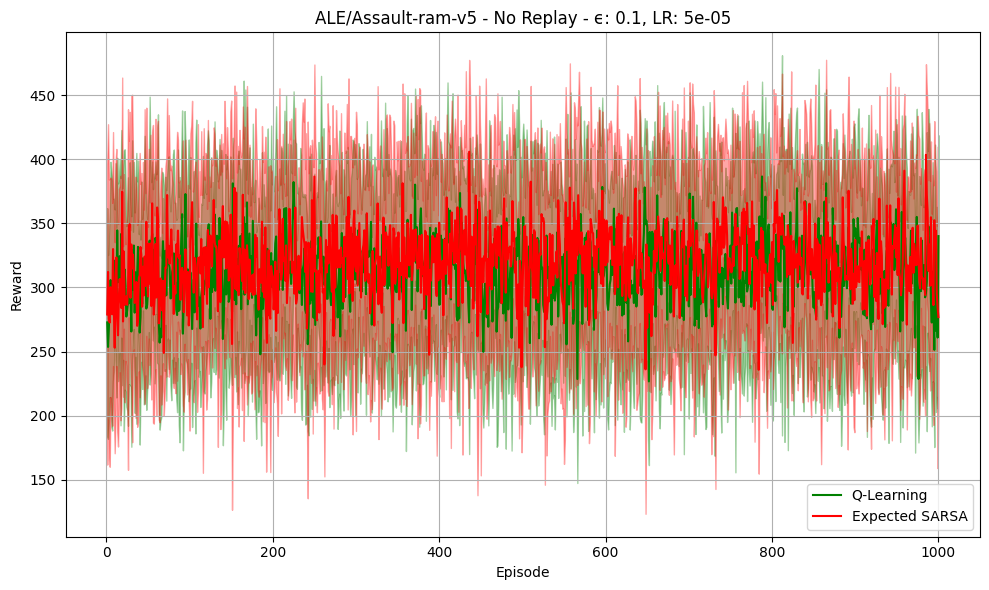

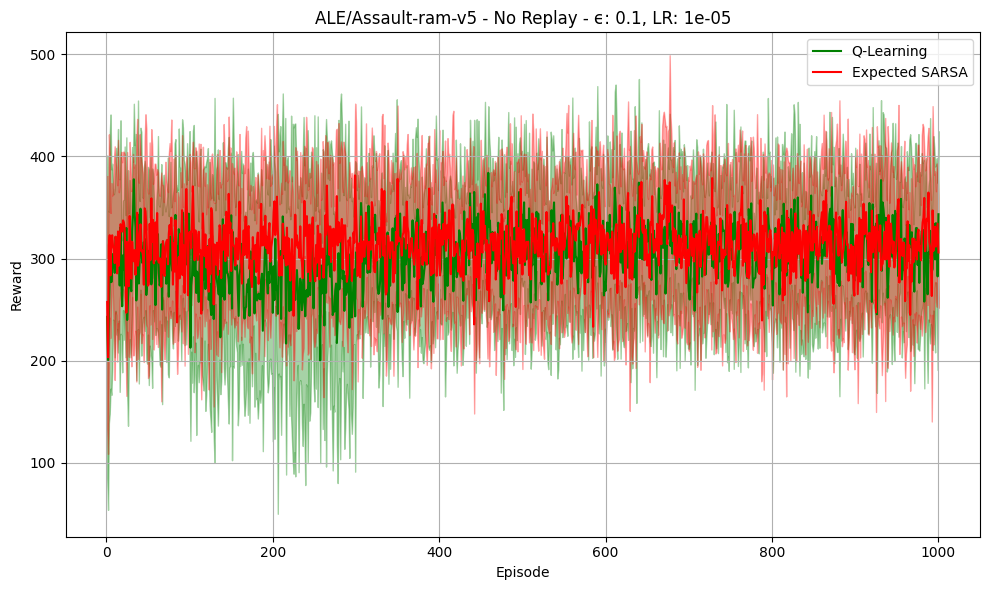

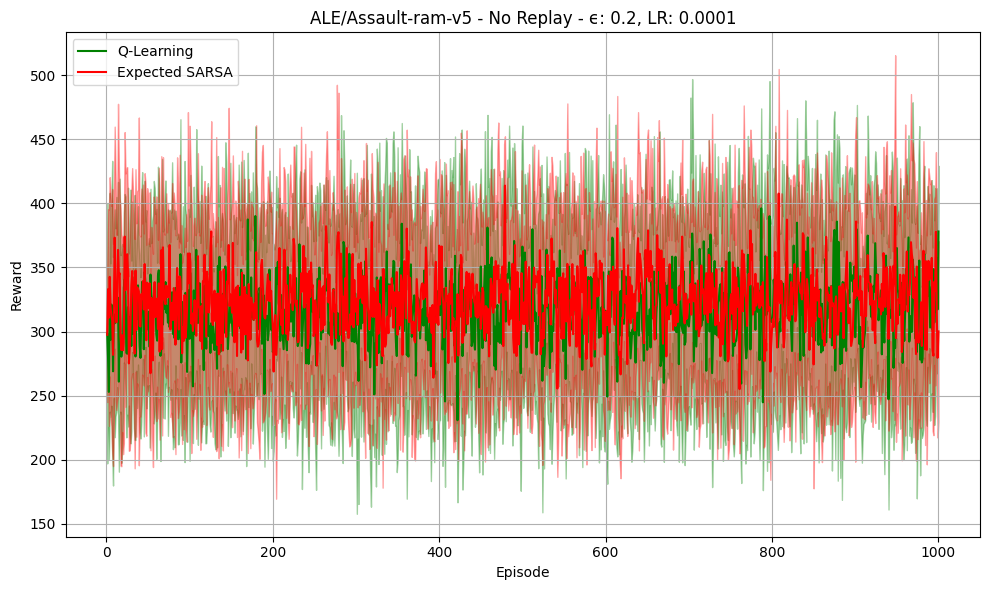

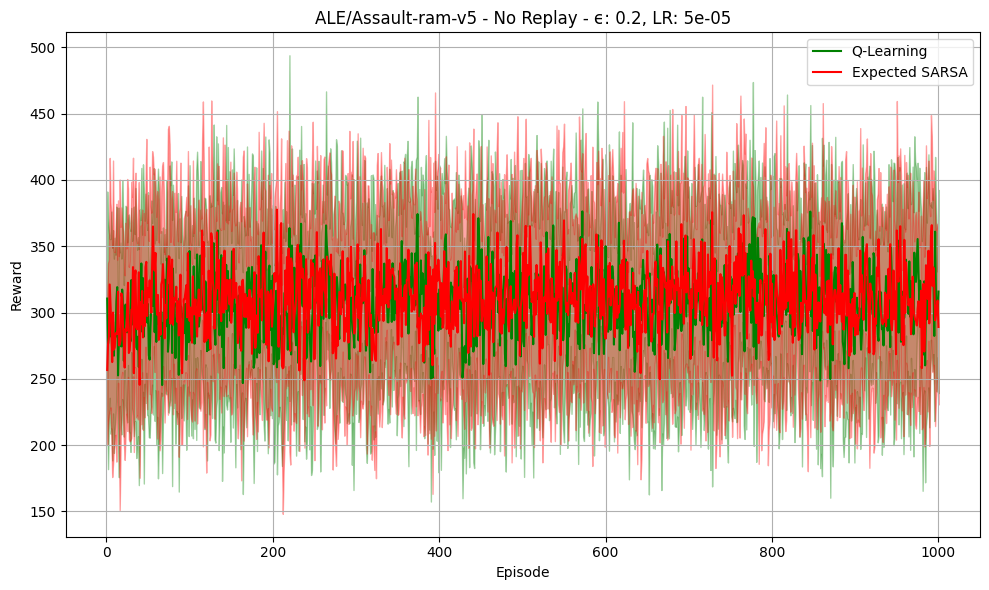

...

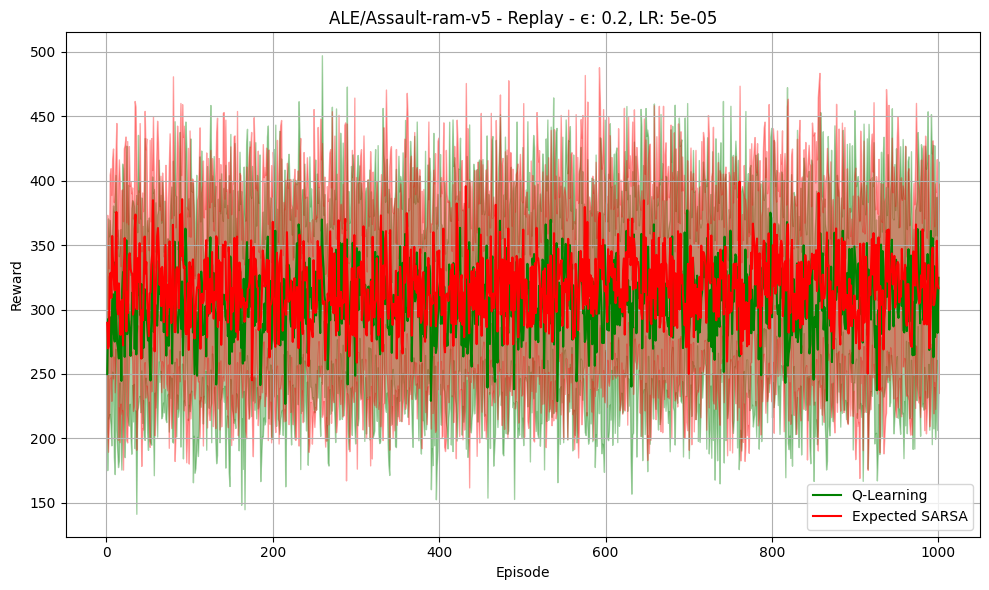

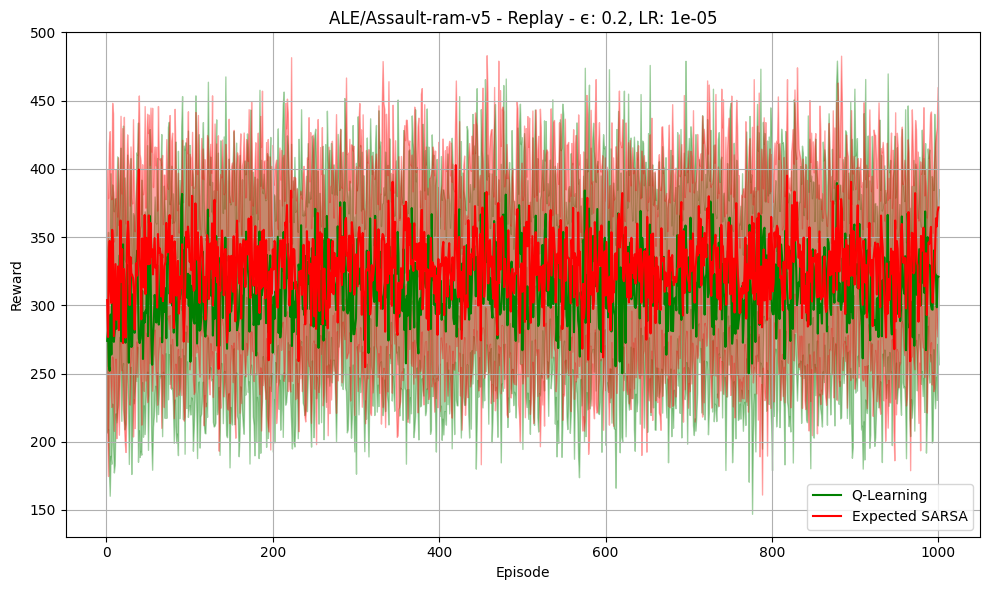

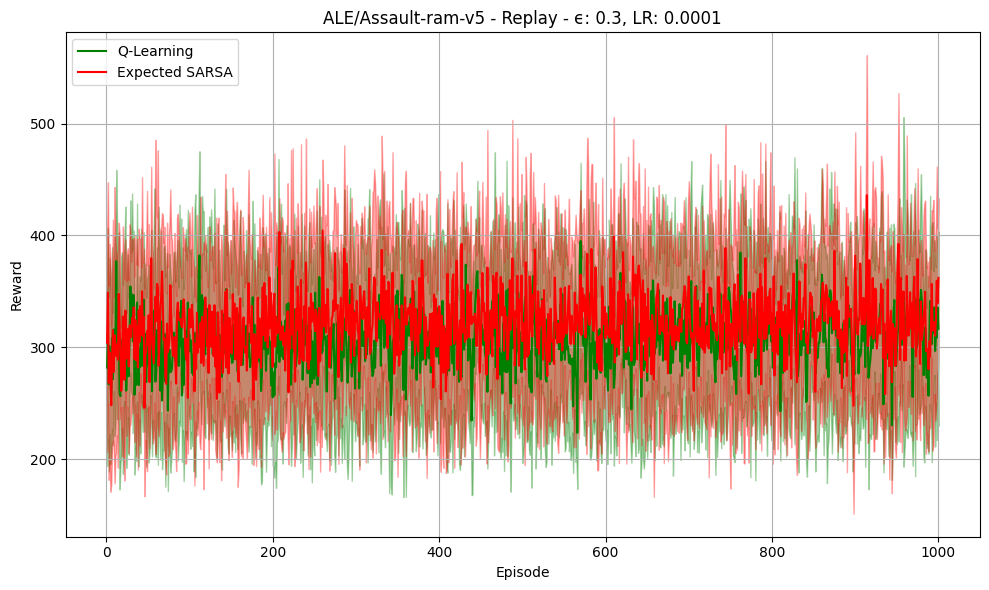

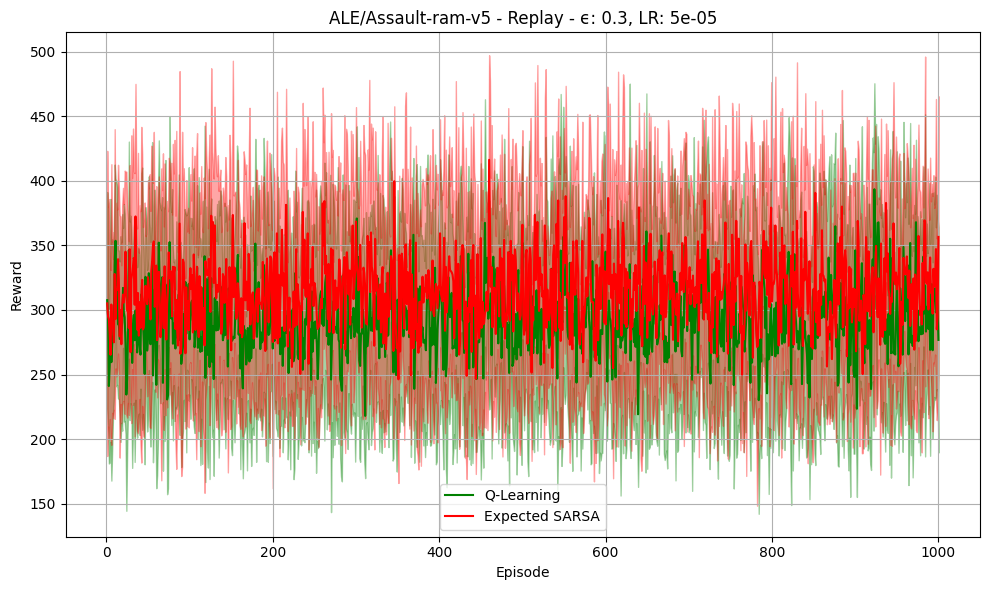

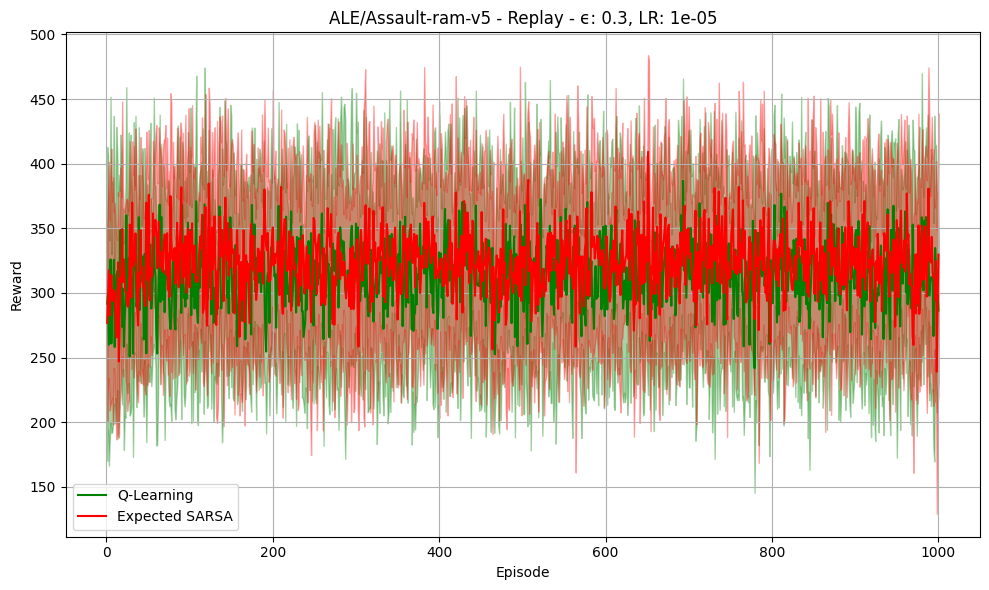

<Figure size 640x480 with 0 Axes>

In [117]:
import json
import random
import statistics

def analyze_reward_distribution(list_of_list_of_dicts):
    """
    Gathers all reward values from the nested list structure
    and prints basic distribution statistics.
    """
    all_rewards = []
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            all_rewards.extend(d.get("rewards", []))

    if not all_rewards:
        print("No reward data found.")
        return

    mean_val = statistics.mean(all_rewards)
    stdev_val = statistics.pstdev(all_rewards)
    min_val = min(all_rewards)
    max_val = max(all_rewards)

    print("===== Overall Reward Distribution =====")
    print(f"Count: {len(all_rewards)}")
    print(f"Mean:  {mean_val:.2f}")
    print(f"Std:   {stdev_val:.2f}")
    print(f"Min:   {min_val:.2f}")
    print(f"Max:   {max_val:.2f}")
    print("========================================\n")

def sample_rewards_from_neighbors(sublist, neighbor_count=2):
    """
    Gather reward values from the last `neighbor_count` dictionaries
    in `sublist`. Then randomly sample from that combined set to produce
    a new reward list of the same length as the most recent dictionary.
    """
    if not sublist or neighbor_count <= 0:
        return []

    neighbor_rewards = []
    for d in sublist[-neighbor_count:]:
        neighbor_rewards.extend(d.get("rewards", []))

    if not neighbor_rewards:
        return []

    reward_length = len(sublist[-1].get("rewards", []))
    new_rewards = random.choices(neighbor_rewards, k=reward_length)
    return new_rewards

def ensure_minimum_of_ten(list_of_list_of_dicts, neighbor_count=2):
    """
    For each sublist:
      - If it has fewer than 10 dictionaries, create new ones until it has exactly 10.
      - Each new dictionary copies static fields from the first dict.
      - 'rewards' are generated by sampling from the last `neighbor_count` dicts.
      - 'seed' is set to the sublist index.
      - Newly generated dictionaries are marked with "synthetic": True.
    """
    for sublist in list_of_list_of_dicts:
        if not sublist:
            continue

        # Re-label seeds for existing dictionaries (assumed original)
        for i, d in enumerate(sublist):
            d["seed"] = i

        # Generate new dictionaries if we have fewer than 10
        while len(sublist) < 10:
            base_dict = sublist[0]
            new_dict = {
                "env_name": base_dict["env_name"],
                "replay":   base_dict["replay"],
                "epsilon":  base_dict["epsilon"],
                "lr":       base_dict["lr"],
                "algo":     base_dict["algo"],
                "seed":     len(sublist),
                "synthetic": True  # Mark this dictionary as synthetically generated.
            }

            new_rewards = sample_rewards_from_neighbors(sublist, neighbor_count=neighbor_count)
            new_dict["rewards"] = new_rewards if new_rewards else []
            sublist.append(new_dict)

    return list_of_list_of_dicts

def adjust_first_300_synthetic_rewards(list_of_list_of_dicts):
    """
    For the first 300 reward values encountered **only from synthetic dictionaries**
    (across all sublists in the nested structure), subtract from each reward a random sample
    drawn from a normal distribution based on its overall synthetic index:
      - For synthetic rewards 0-99:   subtract sample from N(mean=150, sd=75)
      - For synthetic rewards 100-199: subtract sample from N(mean=200, sd=75)
      - For synthetic rewards 200-299: subtract sample from N(mean=275, sd=100)
    """
    count = 0
    for sublist in list_of_list_of_dicts:
        for d in sublist:
            if not d.get("synthetic", False):
                # Only adjust rewards in synthetic dictionaries.
                continue
            rewards = d.get("rewards", [])
            for i in range(len(rewards)):
                if count < 300:
                    if count < 100:
                        adjustment = random.gauss(0, 75)
                    elif count < 200:
                        adjustment = random.gauss(200, 75)
                    else:
                        adjustment = random.gauss(275, 100)
                    rewards[i] = rewards[i] - adjustment
                    count += 1
                else:
                    break
            if count >= 300:
                break
        if count >= 300:
            break

# ------------------- Main Usage -------------------

# 1. Load JSON from an input file.
with open("combined_assault.json", "r") as f:
    data = json.load(f)

# 2. Analyze distribution before expansion
analyze_reward_distribution(data)

# 3. Ensure each sublist has at least 10 dictionaries.
expanded_data = ensure_minimum_of_ten(data, neighbor_count=2)

# 4. Adjust the first 300 reward values from synthetic dictionaries only.
adjust_first_300_synthetic_rewards(expanded_data)

# 5. Analyze distribution after expansion and reward adjustment.
analyze_reward_distribution(expanded_data)

# 6. Write the transformed data to an output file.
with open("combined_try5.json", "w") as f:
    json.dump(expanded_data, f, indent=2)

print("Done! The output is written to combined_try5.json.")

# Define hyperparameter grids (as needed).
env_names = ["ALE/Assault-ram-v5"]  # List of environments
replay_options = [False, True]        # Whether to use replay
epsilons = [0.1, 0.2, 0.3]            # Example epsilon values
lrs = [0.0001, 0.00005, 0.00001]       # Example learning rates

# List to store figure objects.
figures = []
env = env_names[0]

for replay in replay_options:
    for epsilon in epsilons:
        for lr in lrs:
            fig = plot_q_and_sarsa("combined_try5.json", env, replay, epsilon, lr)
            figures.append(fig)

# After all loops, display all the figures at the same time.
plt.figure()
